# 1. Load dataset
#### In this assignment, you are expected to build a model that finds clusters in the given news articles dataset.
#### You will need to read the data from data file (news.xlsx). It contains three columns: news category, news title, and the news content.

In [1]:
import numpy as np
np.random.seed(42)
import pandas as pd
from matplotlib import pyplot as plt
from tqdm import tqdm

In [2]:
data = pd.read_excel("data/news.xlsx")

# 2. Data preprocessing
#### You are expected to extract features from the news articles using tf-idf representation techniques. You can use TfidfVectorizer for this purpose. You may want to limit the vocabulary size by choosing most frequent 3000 tokens. Experiment with different sizes.

In [3]:
x = data["News_Article"]
y = data["Category"]

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=3000)
data_tf = tfidf.fit_transform(x)

In [6]:
data_tf.shape

(50000, 3000)

# 3. PCA
#### Apply PCA on the prepared data with 3 components. Use TruncatedSVD.

In [ ]:
from sklearn.decomposition import TruncatedSVD
pca = TruncatedSVD(n_components=3)
data_tf_pca = pca.fit_transform(data_tf)

In [9]:
data_tf_pca.shape

(50000, 3)

# 4. Visualization
#### Visualize the data in 3D.

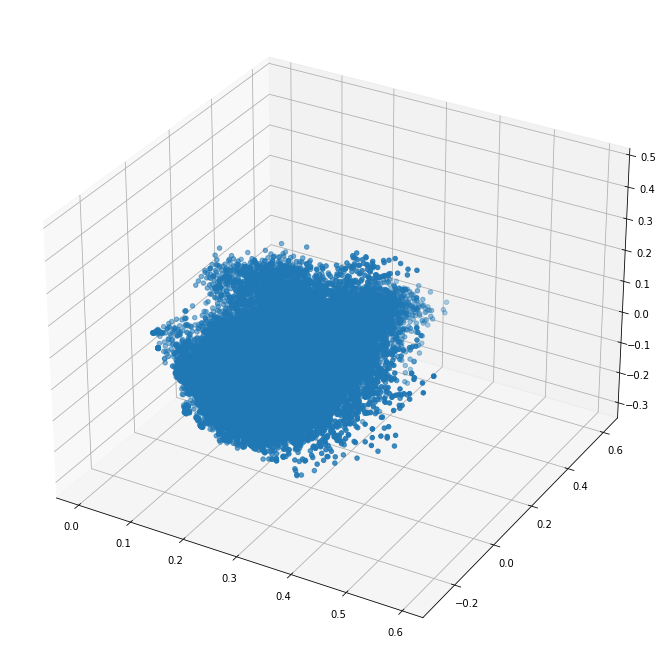

In [10]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')
ax.scatter(data_tf_pca[:, 0], data_tf_pca[:, 1], data_tf_pca[:, 2])
plt.show()

# 5. Clustering
#### Apply Kmeans clustering on the data.

In [11]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=6).fit(data_tf_pca)
kmeans.labels_

array([1, 3, 1, ..., 0, 5, 0])

In [13]:
kmeans.inertia_

384.9545488644214

In [14]:
np.unique(kmeans.labels_)

array([0, 1, 2, 3, 4, 5])

# 6. Visualization
#### Visualize the data in 3D with cluster as color. Use plotly to make it interactive.
#### Your plot should look like the following:
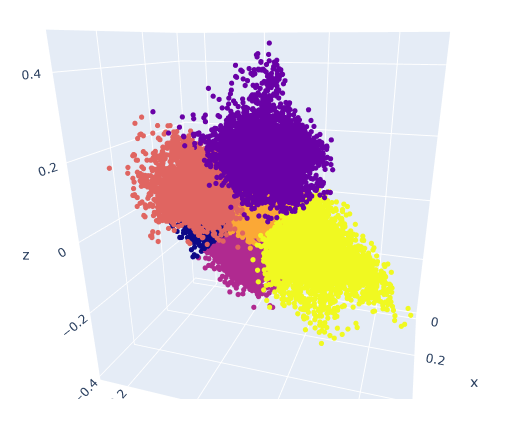

In [15]:
import plotly.express as px
fig = px.scatter_3d(x=data_tf_pca[:,0], y=data_tf_pca[:,1], z=data_tf_pca[:,2], color=kmeans.labels_)
fig.update_traces(marker_size=3)
fig.show()

In [16]:
from sklearn.metrics import silhouette_score
silhouette_score(data_tf_pca, kmeans.labels_)

0.27166146371510086

In [17]:
elbow = []
silhouette = []
for k in tqdm(range(2, 11)):
    kmeans = KMeans(n_clusters=k).fit(data_tf_pca)
    elbow.append(kmeans.inertia_)
    silhouette.append(silhouette_score(data_tf_pca, kmeans.labels_))

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [04:38<00:00, 30.95s/it]


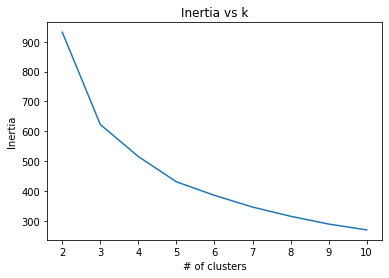

In [18]:
plt.plot(range(2, 11), elbow)
plt.xlabel("# of clusters")
plt.ylabel("Inertia")
plt.title("Inertia vs k")
plt.show()

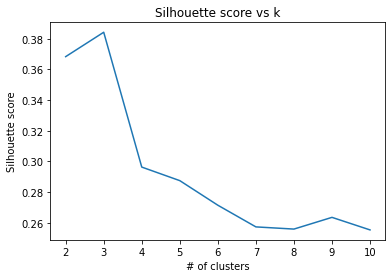

In [19]:
plt.plot(range(2, 11), silhouette)
plt.xlabel("# of clusters")
plt.ylabel("Silhouette score")
plt.title("Silhouette score vs k")
plt.show()